# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
#data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

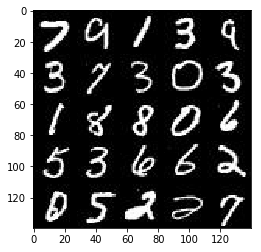

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

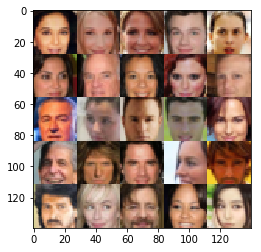

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, shape=(None, image_height, image_width, image_channels))
    input_z = tf.placeholder(tf.float32, shape=(None, z_dim))
    learning_rate = tf.placeholder(tf.float32, shape=())

    return input_real, input_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha = 0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
   
    with tf.variable_scope('discriminator', reuse=reuse):
        x = tf.layers.conv2d(images, 32, 5, 2,'same', use_bias=False, activation=None)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.85)
        
        x = tf.layers.conv2d(x, 64, 5, 2,'same', use_bias=False, activation=None)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.85)
        
        x = tf.layers.conv2d(x, 128, 5, 2,'same', use_bias=False, activation=None)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.85)

        x_flat = tf.reshape(x, (-1, 4*4*128))
        logits = tf.layers.dense(x_flat, 1, activation=None)
        output = tf.sigmoid(logits)
        
    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True,alpha = 0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope('generator', reuse=not is_train):
        x = tf.layers.dense(z, 3*3*512, use_bias=False, activation=None)
        x = tf.reshape(x, (-1, 3, 3, 512))
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.85)
 
        
        x = tf.layers.conv2d_transpose(x, 256, 5, 2,'same', use_bias=False, activation=None)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.85)
      
        
        x = tf.layers.conv2d_transpose(x, 128, 5, 2,'same', use_bias=False, activation=None)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.maximum(alpha * x, x)
        x = tf.nn.dropout(x, 0.85)
     
        
        x = tf.layers.conv2d_transpose(x, out_channel_dim, 6, 2,'valid', activation=None)
        out = tf.tanh(x)
   
        
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    steps = 0
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                 # Change the range from (-0.5, 0.5) to (-1, 1) to be consistent with batch_z
                batch_images *= 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                _ = sess.run([d_train_opt, g_train_opt], feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})

                if steps % 100 == 0:
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_real: batch_images, input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)         
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.4444... Generator Loss: 6.2291


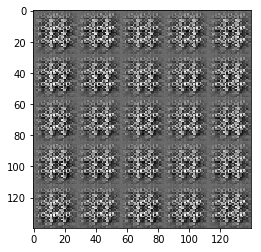

Epoch 1/2... Discriminator Loss: 0.6681... Generator Loss: 9.4944


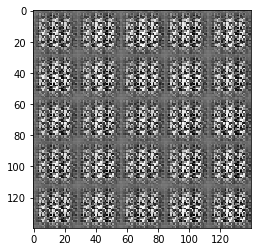

Epoch 1/2... Discriminator Loss: 0.7419... Generator Loss: 1.6630


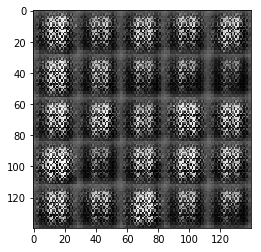

Epoch 1/2... Discriminator Loss: 0.9610... Generator Loss: 1.5156


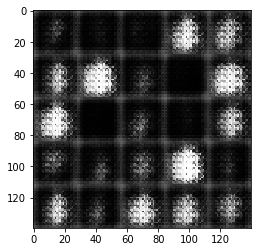

Epoch 1/2... Discriminator Loss: 0.6865... Generator Loss: 2.2743


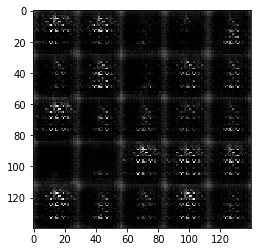

Epoch 1/2... Discriminator Loss: 0.5526... Generator Loss: 2.4271


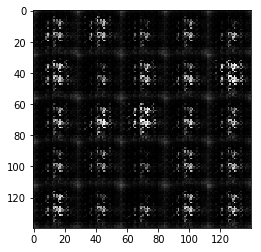

Epoch 1/2... Discriminator Loss: 1.0590... Generator Loss: 1.8681


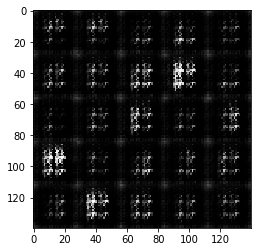

Epoch 1/2... Discriminator Loss: 0.5292... Generator Loss: 3.4217


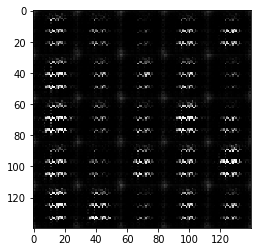

Epoch 1/2... Discriminator Loss: 1.9014... Generator Loss: 6.7927


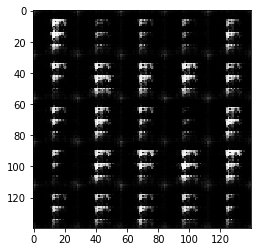

Epoch 1/2... Discriminator Loss: 0.6849... Generator Loss: 2.9444


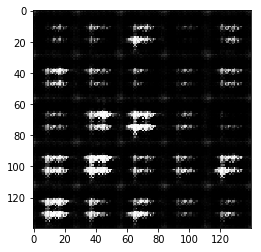

Epoch 1/2... Discriminator Loss: 0.6868... Generator Loss: 2.5764


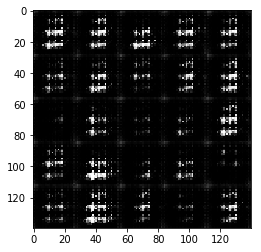

Epoch 1/2... Discriminator Loss: 0.4504... Generator Loss: 3.3375


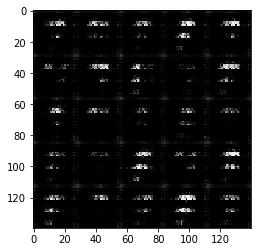

Epoch 1/2... Discriminator Loss: 0.8763... Generator Loss: 1.4922


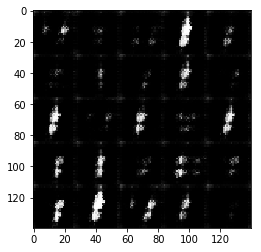

Epoch 1/2... Discriminator Loss: 1.1435... Generator Loss: 1.5771


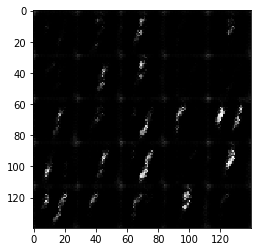

Epoch 1/2... Discriminator Loss: 1.3590... Generator Loss: 0.7699


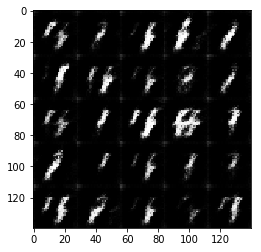

Epoch 1/2... Discriminator Loss: 0.6551... Generator Loss: 2.6323


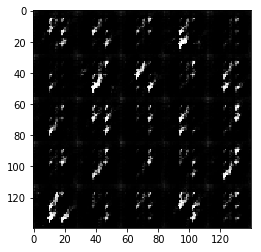

Epoch 1/2... Discriminator Loss: 0.6126... Generator Loss: 4.5261


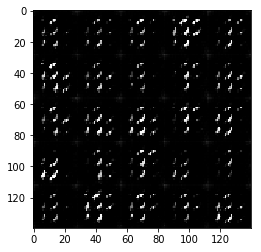

Epoch 1/2... Discriminator Loss: 0.9479... Generator Loss: 1.5810


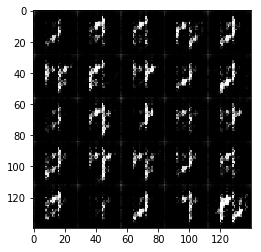

Epoch 1/2... Discriminator Loss: 0.7971... Generator Loss: 3.1516


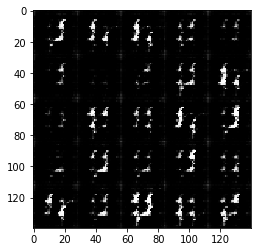

Epoch 1/2... Discriminator Loss: 0.7547... Generator Loss: 2.5372


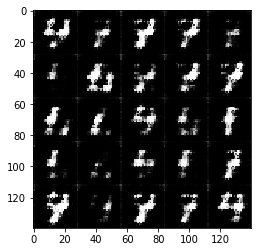

Epoch 1/2... Discriminator Loss: 0.9257... Generator Loss: 1.7479


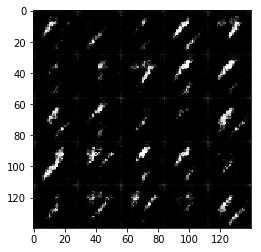

Epoch 1/2... Discriminator Loss: 0.7994... Generator Loss: 2.0664


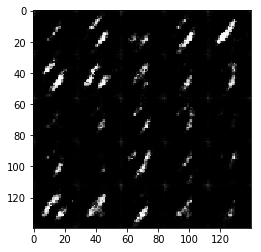

Epoch 1/2... Discriminator Loss: 0.9801... Generator Loss: 1.2572


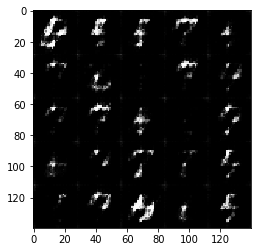

Epoch 1/2... Discriminator Loss: 0.9546... Generator Loss: 2.1964


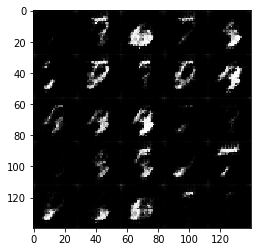

Epoch 1/2... Discriminator Loss: 0.6393... Generator Loss: 2.4001


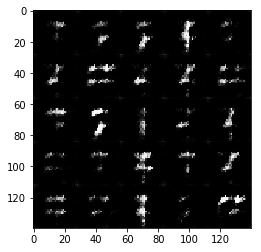

Epoch 1/2... Discriminator Loss: 0.7332... Generator Loss: 1.7966


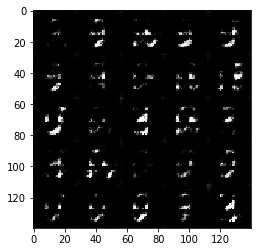

Epoch 1/2... Discriminator Loss: 0.7543... Generator Loss: 2.3674


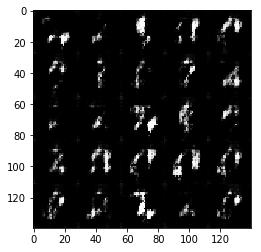

Epoch 1/2... Discriminator Loss: 0.8283... Generator Loss: 1.7670


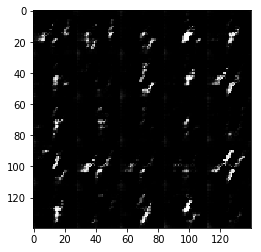

Epoch 1/2... Discriminator Loss: 0.8002... Generator Loss: 2.6037


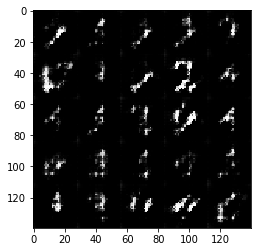

Epoch 1/2... Discriminator Loss: 0.9014... Generator Loss: 2.1158


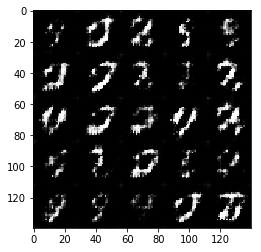

Epoch 1/2... Discriminator Loss: 0.7261... Generator Loss: 2.6632


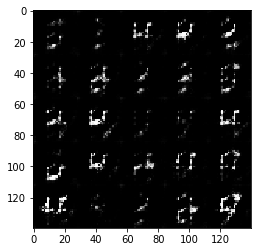

Epoch 1/2... Discriminator Loss: 0.6683... Generator Loss: 2.7204


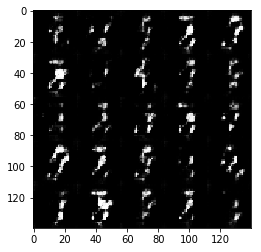

Epoch 1/2... Discriminator Loss: 0.9995... Generator Loss: 1.4750


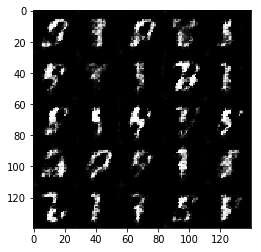

Epoch 1/2... Discriminator Loss: 0.8690... Generator Loss: 3.1655


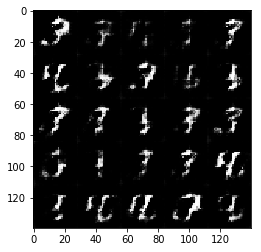

Epoch 1/2... Discriminator Loss: 0.7238... Generator Loss: 2.2728


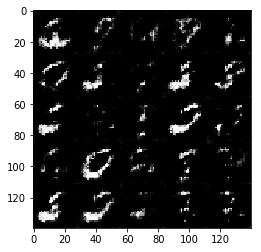

Epoch 1/2... Discriminator Loss: 0.8115... Generator Loss: 1.7601


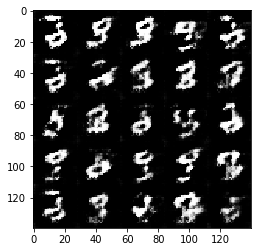

Epoch 1/2... Discriminator Loss: 0.8244... Generator Loss: 2.8583


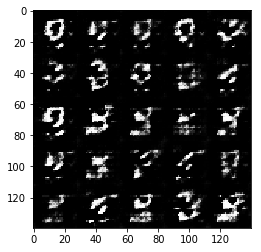

Epoch 1/2... Discriminator Loss: 0.8826... Generator Loss: 1.8852


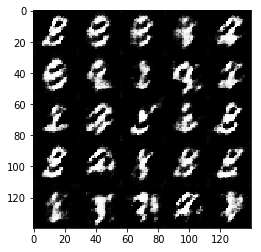

Epoch 1/2... Discriminator Loss: 0.9880... Generator Loss: 1.6735


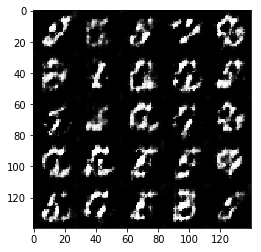

Epoch 1/2... Discriminator Loss: 1.2883... Generator Loss: 0.9234


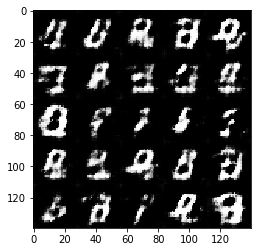

Epoch 1/2... Discriminator Loss: 1.0500... Generator Loss: 1.3520


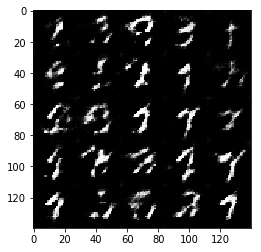

Epoch 1/2... Discriminator Loss: 0.9465... Generator Loss: 1.5549


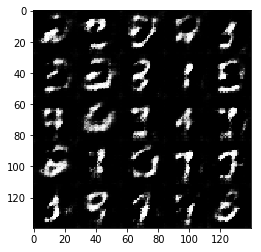

Epoch 1/2... Discriminator Loss: 0.9581... Generator Loss: 1.5508


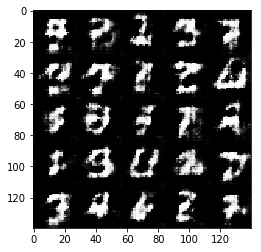

Epoch 1/2... Discriminator Loss: 1.6434... Generator Loss: 0.5222


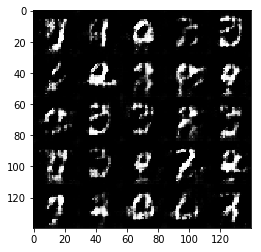

Epoch 1/2... Discriminator Loss: 1.1450... Generator Loss: 1.3651


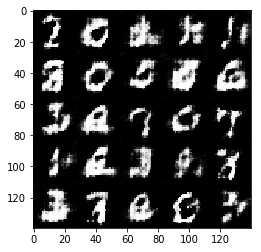

Epoch 1/2... Discriminator Loss: 0.9467... Generator Loss: 1.4814


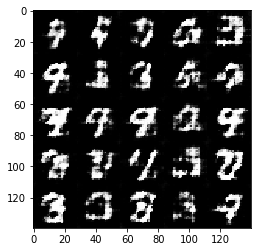

Epoch 2/2... Discriminator Loss: 1.0118... Generator Loss: 1.0864


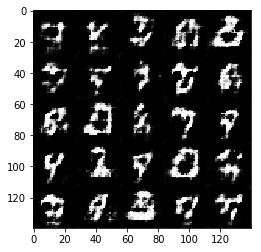

Epoch 2/2... Discriminator Loss: 0.9679... Generator Loss: 1.3256


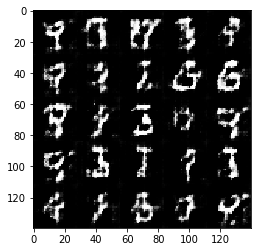

Epoch 2/2... Discriminator Loss: 1.0679... Generator Loss: 1.4129


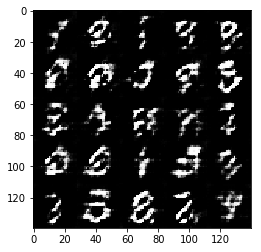

Epoch 2/2... Discriminator Loss: 0.9010... Generator Loss: 1.4426


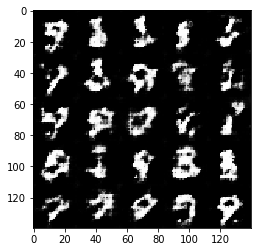

Epoch 2/2... Discriminator Loss: 0.9892... Generator Loss: 1.9031


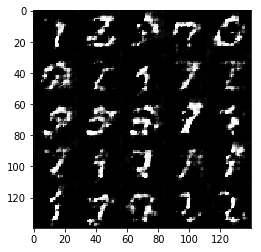

Epoch 2/2... Discriminator Loss: 1.5835... Generator Loss: 0.5359


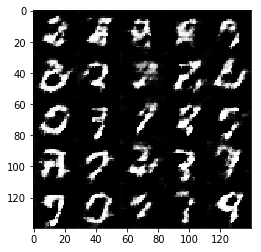

Epoch 2/2... Discriminator Loss: 0.9608... Generator Loss: 1.4527


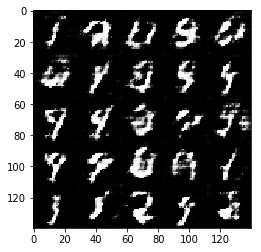

Epoch 2/2... Discriminator Loss: 0.9709... Generator Loss: 1.8396


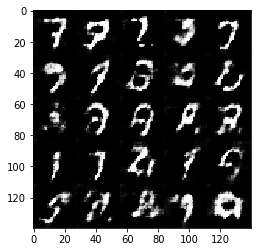

Epoch 2/2... Discriminator Loss: 0.9931... Generator Loss: 1.6291


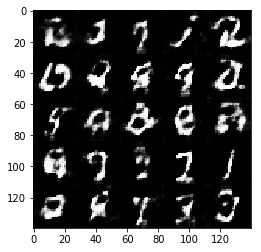

Epoch 2/2... Discriminator Loss: 1.1209... Generator Loss: 0.9179


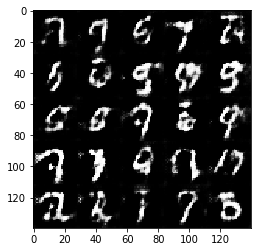

Epoch 2/2... Discriminator Loss: 1.0755... Generator Loss: 1.5283


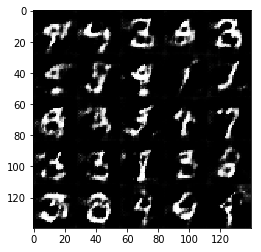

Epoch 2/2... Discriminator Loss: 1.1356... Generator Loss: 1.6539


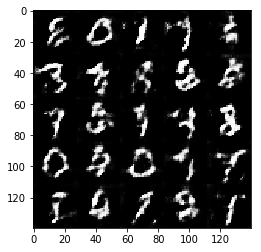

Epoch 2/2... Discriminator Loss: 1.0292... Generator Loss: 1.8350


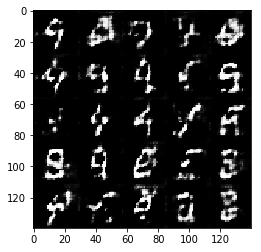

Epoch 2/2... Discriminator Loss: 1.2667... Generator Loss: 2.9554


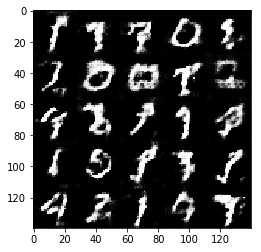

Epoch 2/2... Discriminator Loss: 0.8127... Generator Loss: 1.9223


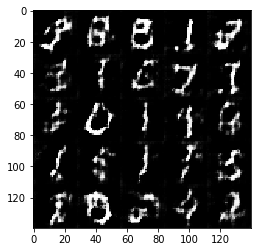

Epoch 2/2... Discriminator Loss: 0.9222... Generator Loss: 1.6242


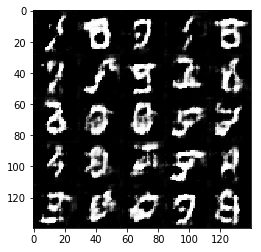

Epoch 2/2... Discriminator Loss: 1.1214... Generator Loss: 2.3583


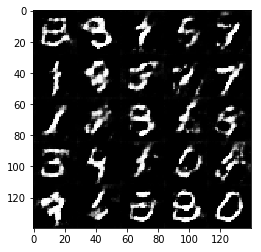

Epoch 2/2... Discriminator Loss: 1.0241... Generator Loss: 1.0979


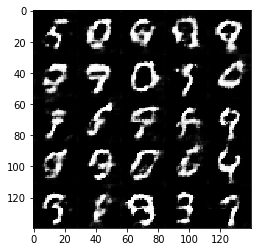

Epoch 2/2... Discriminator Loss: 0.9563... Generator Loss: 1.4401


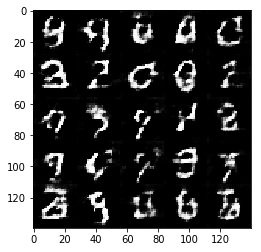

Epoch 2/2... Discriminator Loss: 0.8766... Generator Loss: 1.6374


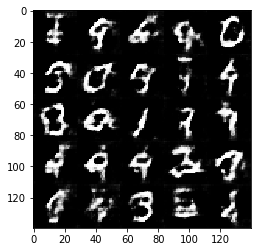

Epoch 2/2... Discriminator Loss: 0.8937... Generator Loss: 1.6675


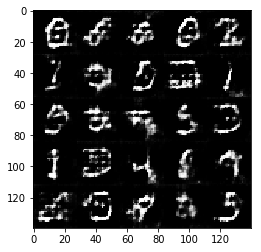

Epoch 2/2... Discriminator Loss: 1.0707... Generator Loss: 1.8242


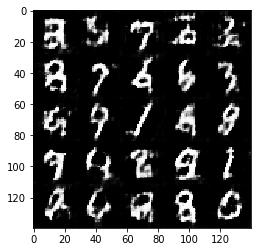

Epoch 2/2... Discriminator Loss: 1.0162... Generator Loss: 1.5996


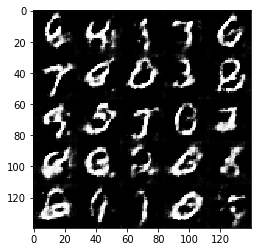

Epoch 2/2... Discriminator Loss: 0.9605... Generator Loss: 1.4243


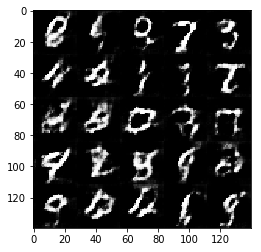

Epoch 2/2... Discriminator Loss: 1.0061... Generator Loss: 1.4610


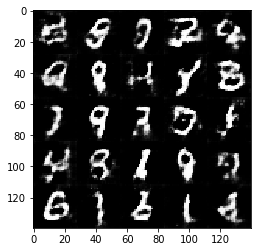

Epoch 2/2... Discriminator Loss: 1.1034... Generator Loss: 1.0162


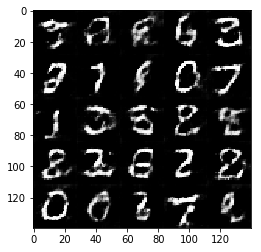

Epoch 2/2... Discriminator Loss: 1.0354... Generator Loss: 1.4936


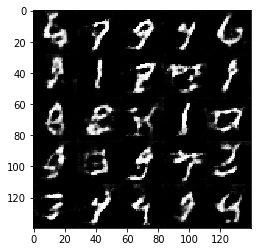

Epoch 2/2... Discriminator Loss: 1.1750... Generator Loss: 1.9380


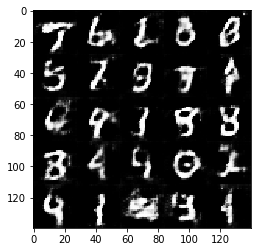

Epoch 2/2... Discriminator Loss: 0.9929... Generator Loss: 1.3627


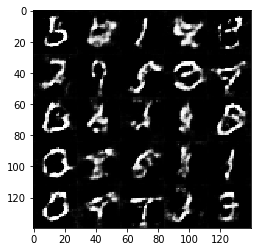

Epoch 2/2... Discriminator Loss: 1.2239... Generator Loss: 0.8167


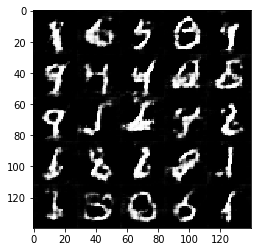

Epoch 2/2... Discriminator Loss: 0.9955... Generator Loss: 1.7623


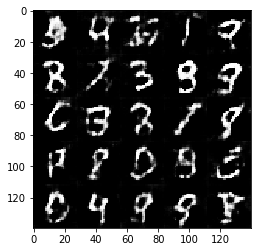

Epoch 2/2... Discriminator Loss: 1.0743... Generator Loss: 1.5691


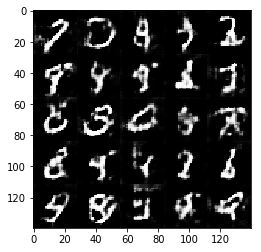

Epoch 2/2... Discriminator Loss: 1.0699... Generator Loss: 1.5832


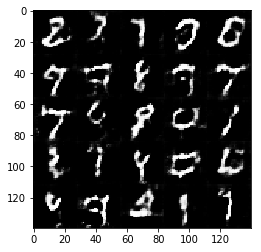

Epoch 2/2... Discriminator Loss: 1.0170... Generator Loss: 1.3789


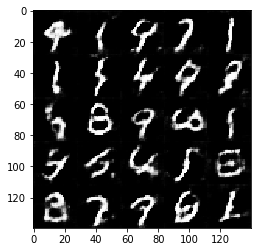

Epoch 2/2... Discriminator Loss: 1.0660... Generator Loss: 1.1126


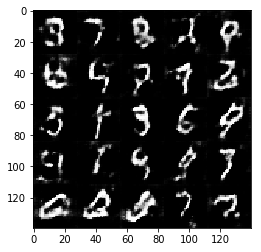

Epoch 2/2... Discriminator Loss: 1.1600... Generator Loss: 1.1820


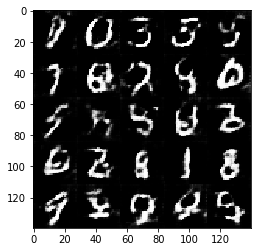

Epoch 2/2... Discriminator Loss: 1.0376... Generator Loss: 1.2744


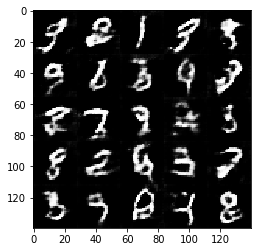

Epoch 2/2... Discriminator Loss: 1.0363... Generator Loss: 1.3549


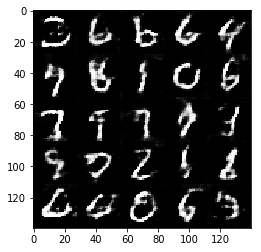

Epoch 2/2... Discriminator Loss: 0.9834... Generator Loss: 1.4454


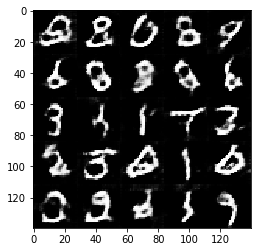

Epoch 2/2... Discriminator Loss: 1.4278... Generator Loss: 0.5968


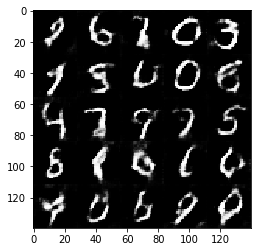

Epoch 2/2... Discriminator Loss: 1.1394... Generator Loss: 1.0945


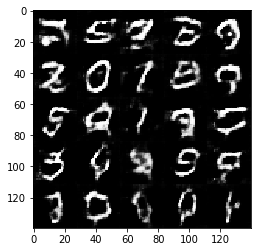

Epoch 2/2... Discriminator Loss: 1.0924... Generator Loss: 1.3136


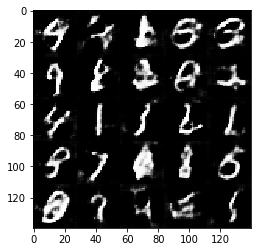

Epoch 2/2... Discriminator Loss: 1.0561... Generator Loss: 1.3865


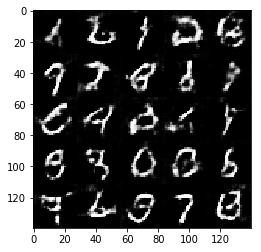

Epoch 2/2... Discriminator Loss: 1.0230... Generator Loss: 1.5748


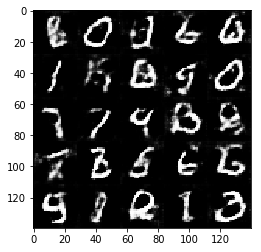

Epoch 2/2... Discriminator Loss: 1.2690... Generator Loss: 0.8010


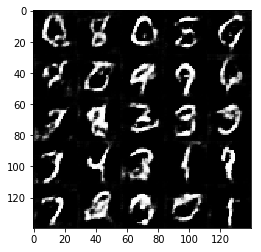

Epoch 2/2... Discriminator Loss: 1.0054... Generator Loss: 1.4001


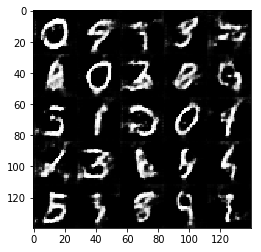

Epoch 2/2... Discriminator Loss: 1.0941... Generator Loss: 1.6193


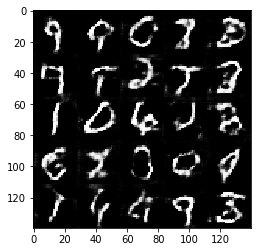

In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.5



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 1.0582... Generator Loss: 1.1935


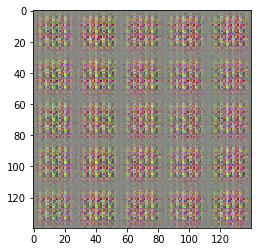

Epoch 1/1... Discriminator Loss: 3.9506... Generator Loss: 0.0526


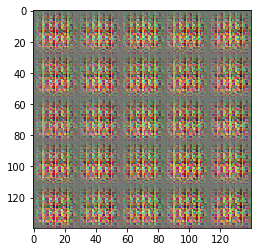

Epoch 1/1... Discriminator Loss: 2.7804... Generator Loss: 0.1516


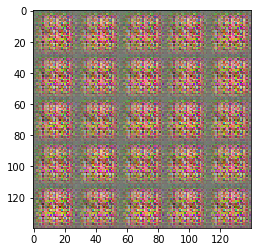

Epoch 1/1... Discriminator Loss: 0.6499... Generator Loss: 2.2733


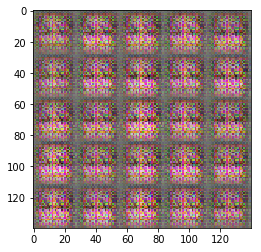

Epoch 1/1... Discriminator Loss: 1.1590... Generator Loss: 2.6393


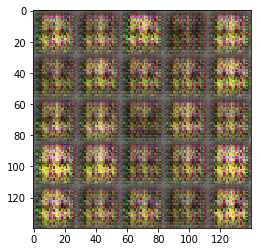

Epoch 1/1... Discriminator Loss: 0.9035... Generator Loss: 1.4122


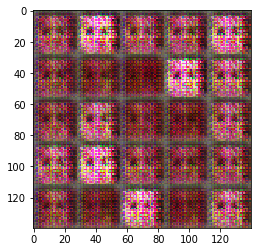

Epoch 1/1... Discriminator Loss: 1.6073... Generator Loss: 0.5104


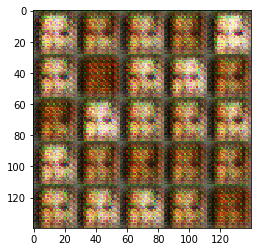

Epoch 1/1... Discriminator Loss: 1.5557... Generator Loss: 3.9023


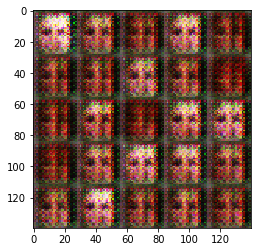

Epoch 1/1... Discriminator Loss: 0.7642... Generator Loss: 3.1754


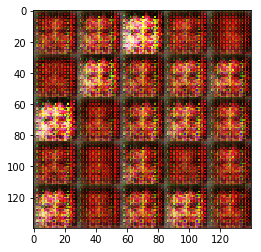

Epoch 1/1... Discriminator Loss: 0.6745... Generator Loss: 2.0119


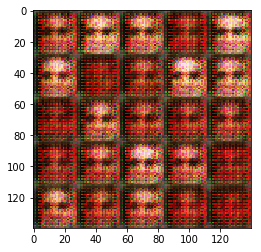

Epoch 1/1... Discriminator Loss: 0.8524... Generator Loss: 5.6042


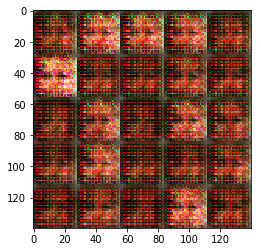

Epoch 1/1... Discriminator Loss: 1.3162... Generator Loss: 0.5748


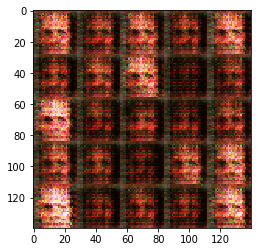

Epoch 1/1... Discriminator Loss: 0.7251... Generator Loss: 2.5226


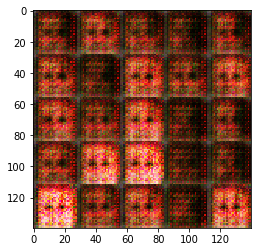

Epoch 1/1... Discriminator Loss: 0.8633... Generator Loss: 2.3891


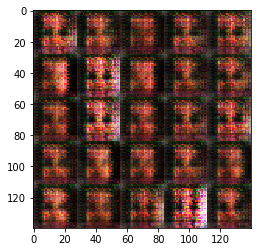

Epoch 1/1... Discriminator Loss: 0.6767... Generator Loss: 4.1446


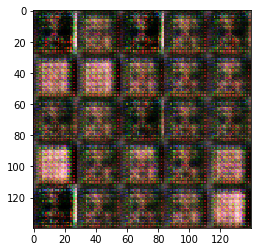

Epoch 1/1... Discriminator Loss: 0.6735... Generator Loss: 1.7255


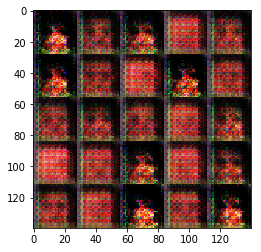

Epoch 1/1... Discriminator Loss: 0.8534... Generator Loss: 2.3202


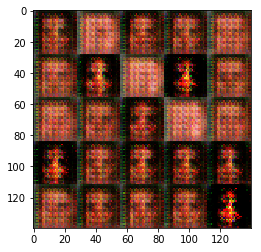

Epoch 1/1... Discriminator Loss: 0.9897... Generator Loss: 1.0608


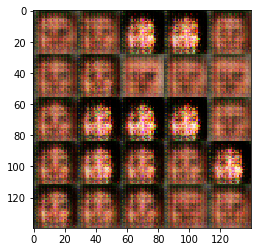

Epoch 1/1... Discriminator Loss: 0.8579... Generator Loss: 2.0893


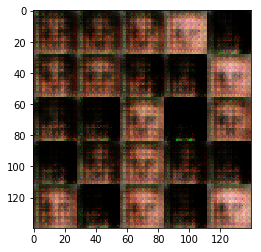

Epoch 1/1... Discriminator Loss: 0.6759... Generator Loss: 1.8520


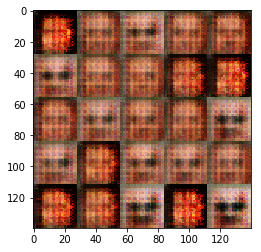

Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.7664


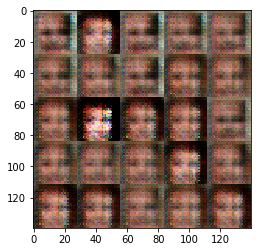

Epoch 1/1... Discriminator Loss: 0.9513... Generator Loss: 1.1935


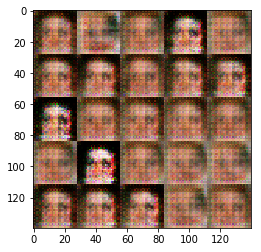

Epoch 1/1... Discriminator Loss: 0.8973... Generator Loss: 1.2929


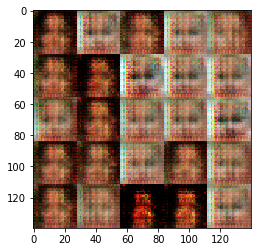

Epoch 1/1... Discriminator Loss: 1.0493... Generator Loss: 3.0064


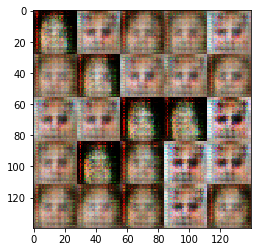

Epoch 1/1... Discriminator Loss: 1.1584... Generator Loss: 1.3612


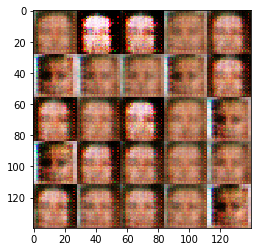

Epoch 1/1... Discriminator Loss: 0.7475... Generator Loss: 2.0378


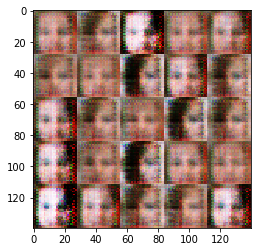

Epoch 1/1... Discriminator Loss: 1.0778... Generator Loss: 0.9219


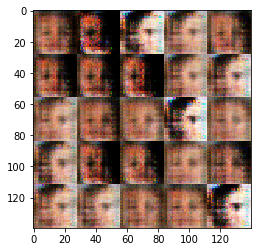

Epoch 1/1... Discriminator Loss: 0.9077... Generator Loss: 1.4136


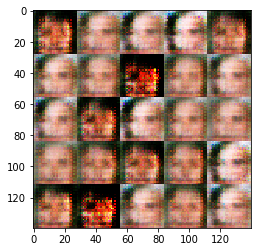

Epoch 1/1... Discriminator Loss: 1.0291... Generator Loss: 3.0785


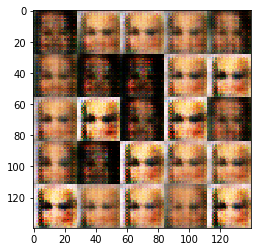

Epoch 1/1... Discriminator Loss: 0.7636... Generator Loss: 1.2618


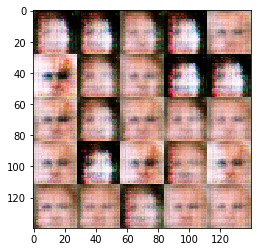

Epoch 1/1... Discriminator Loss: 1.0533... Generator Loss: 1.1056


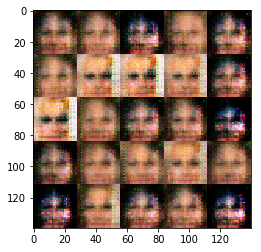

Epoch 1/1... Discriminator Loss: 0.9390... Generator Loss: 1.5950


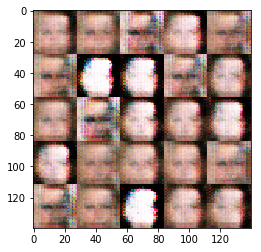

Epoch 1/1... Discriminator Loss: 1.1808... Generator Loss: 2.2387


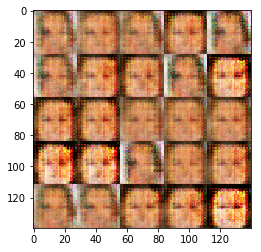

Epoch 1/1... Discriminator Loss: 0.8481... Generator Loss: 1.3005


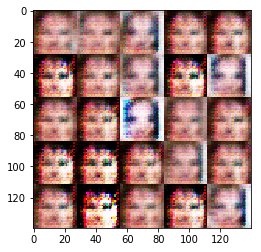

Epoch 1/1... Discriminator Loss: 0.6971... Generator Loss: 3.1330


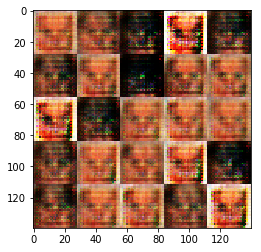

Epoch 1/1... Discriminator Loss: 1.1221... Generator Loss: 0.9488


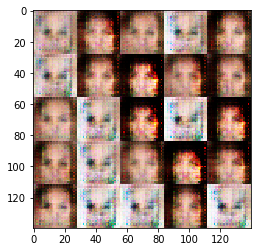

Epoch 1/1... Discriminator Loss: 1.1519... Generator Loss: 0.6859


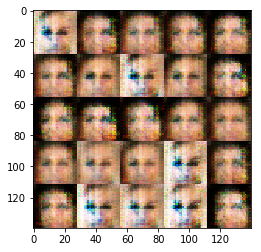

Epoch 1/1... Discriminator Loss: 0.7532... Generator Loss: 1.6667


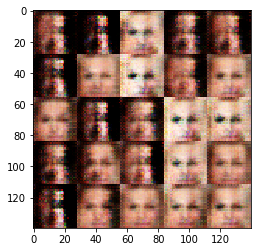

Epoch 1/1... Discriminator Loss: 1.1382... Generator Loss: 2.1827


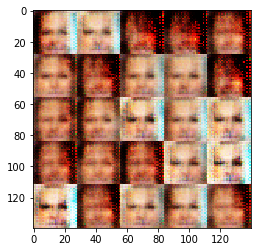

Epoch 1/1... Discriminator Loss: 0.7210... Generator Loss: 2.3191


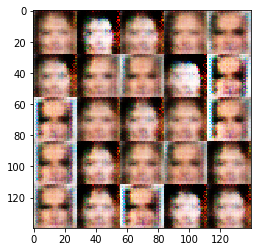

Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 2.0870


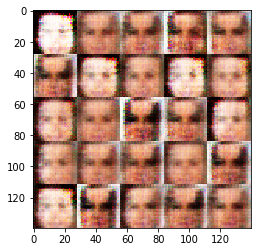

Epoch 1/1... Discriminator Loss: 0.7869... Generator Loss: 1.6649


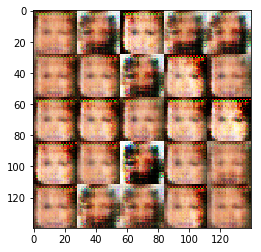

Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 0.9936


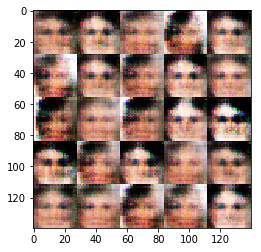

Epoch 1/1... Discriminator Loss: 1.1607... Generator Loss: 3.1161


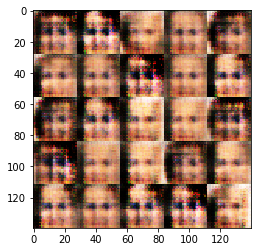

Epoch 1/1... Discriminator Loss: 0.9908... Generator Loss: 2.1054


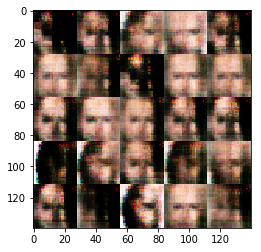

Epoch 1/1... Discriminator Loss: 1.1981... Generator Loss: 0.9757


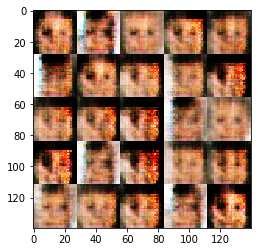

Epoch 1/1... Discriminator Loss: 1.4778... Generator Loss: 0.9805


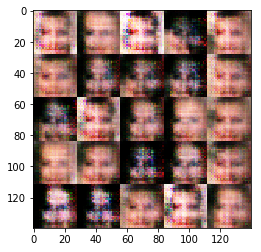

Epoch 1/1... Discriminator Loss: 1.1959... Generator Loss: 1.3517


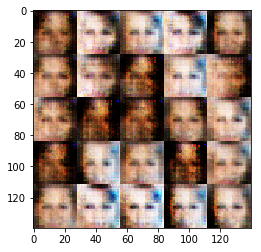

Epoch 1/1... Discriminator Loss: 0.9451... Generator Loss: 1.4886


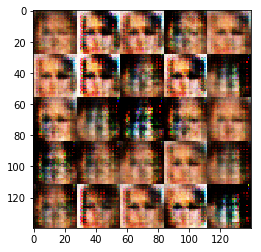

Epoch 1/1... Discriminator Loss: 1.0111... Generator Loss: 1.3010


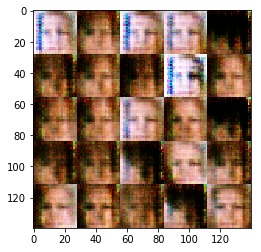

Epoch 1/1... Discriminator Loss: 1.1000... Generator Loss: 0.9631


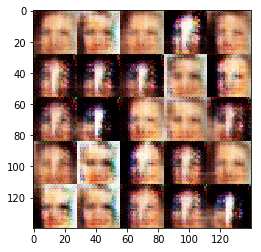

Epoch 1/1... Discriminator Loss: 0.9203... Generator Loss: 1.7962


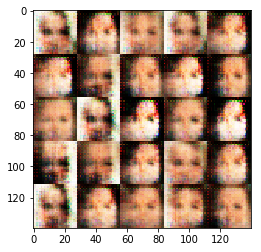

Epoch 1/1... Discriminator Loss: 0.7035... Generator Loss: 2.1606


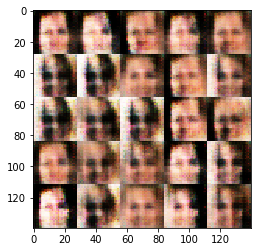

Epoch 1/1... Discriminator Loss: 1.0132... Generator Loss: 1.4520


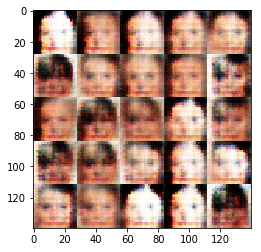

Epoch 1/1... Discriminator Loss: 0.8605... Generator Loss: 1.7015


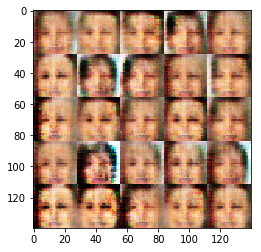

Epoch 1/1... Discriminator Loss: 1.2456... Generator Loss: 1.9497


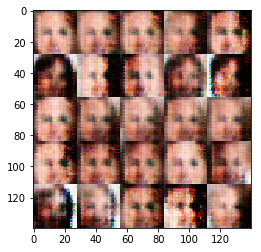

Epoch 1/1... Discriminator Loss: 1.2712... Generator Loss: 0.9941


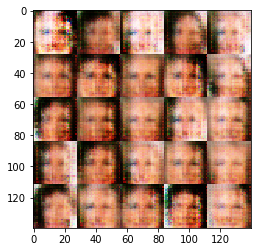

Epoch 1/1... Discriminator Loss: 1.0768... Generator Loss: 1.2238


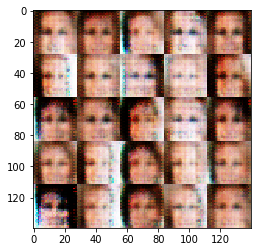

Epoch 1/1... Discriminator Loss: 1.0390... Generator Loss: 1.2267


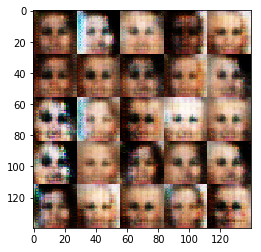

Epoch 1/1... Discriminator Loss: 0.8925... Generator Loss: 2.0198


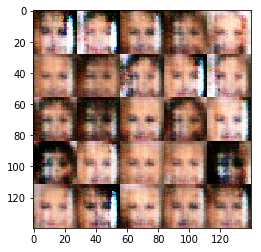

Epoch 1/1... Discriminator Loss: 1.6697... Generator Loss: 0.4509


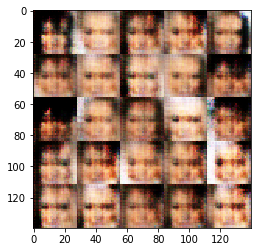

Epoch 1/1... Discriminator Loss: 1.1303... Generator Loss: 0.9252


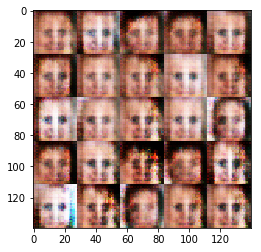

Epoch 1/1... Discriminator Loss: 1.3729... Generator Loss: 0.7542


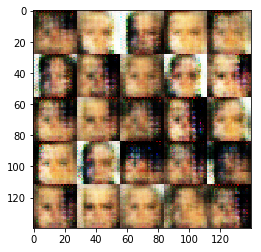

Epoch 1/1... Discriminator Loss: 1.0347... Generator Loss: 1.2668


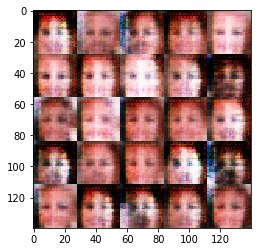

Epoch 1/1... Discriminator Loss: 1.3604... Generator Loss: 0.7044


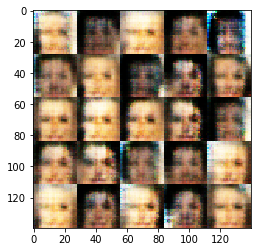

Epoch 1/1... Discriminator Loss: 0.9379... Generator Loss: 1.9437


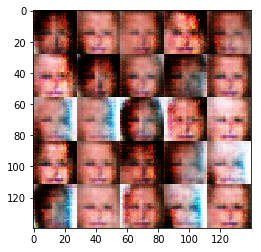

Epoch 1/1... Discriminator Loss: 1.0697... Generator Loss: 1.2664


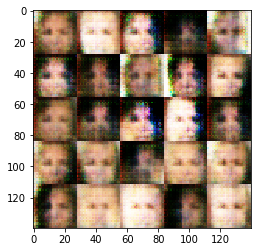

Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 1.4592


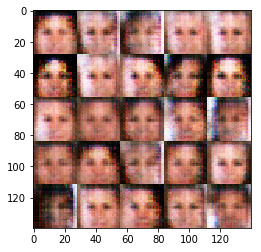

Epoch 1/1... Discriminator Loss: 0.9739... Generator Loss: 1.2725


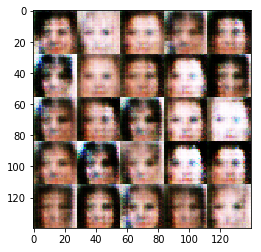

Epoch 1/1... Discriminator Loss: 1.1564... Generator Loss: 1.5835


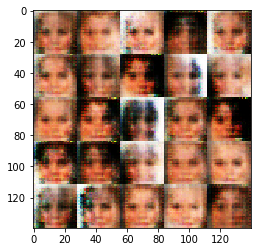

Epoch 1/1... Discriminator Loss: 1.0134... Generator Loss: 0.9386


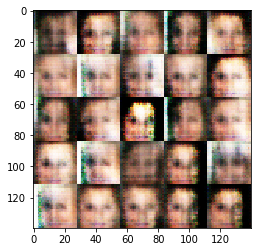

Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 2.4803


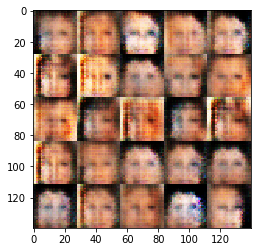

Epoch 1/1... Discriminator Loss: 0.8247... Generator Loss: 1.6942


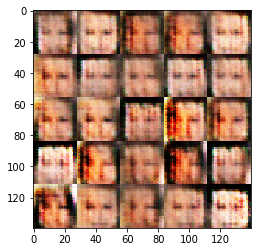

Epoch 1/1... Discriminator Loss: 0.8931... Generator Loss: 1.5438


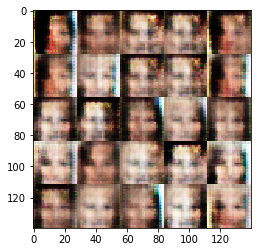

Epoch 1/1... Discriminator Loss: 1.2761... Generator Loss: 1.2698


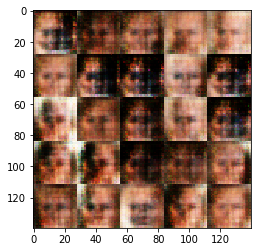

Epoch 1/1... Discriminator Loss: 1.0687... Generator Loss: 1.0514


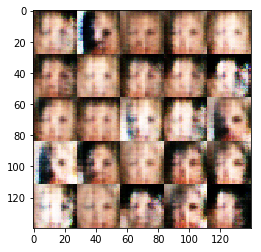

Epoch 1/1... Discriminator Loss: 1.2561... Generator Loss: 1.0330


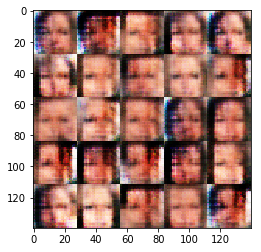

Epoch 1/1... Discriminator Loss: 0.8652... Generator Loss: 1.4831


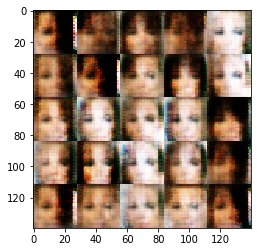

Epoch 1/1... Discriminator Loss: 0.9853... Generator Loss: 2.0919


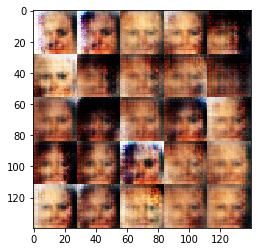

Epoch 1/1... Discriminator Loss: 1.0470... Generator Loss: 1.0847


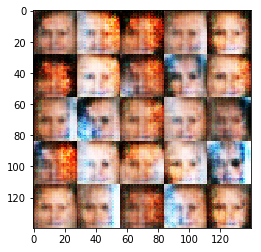

Epoch 1/1... Discriminator Loss: 1.6989... Generator Loss: 0.4234


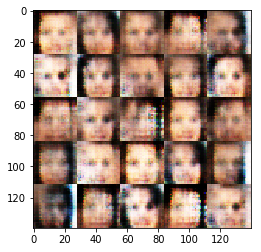

Epoch 1/1... Discriminator Loss: 1.1523... Generator Loss: 1.4751


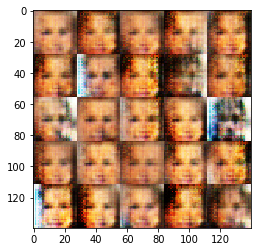

Epoch 1/1... Discriminator Loss: 0.8360... Generator Loss: 1.7854


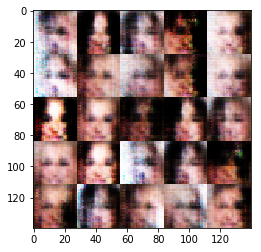

Epoch 1/1... Discriminator Loss: 1.5264... Generator Loss: 0.8705


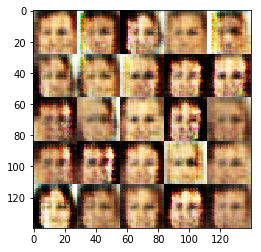

Epoch 1/1... Discriminator Loss: 0.8509... Generator Loss: 1.6974


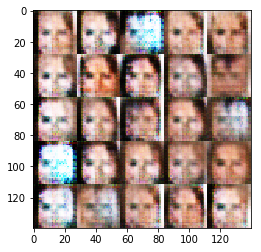

Epoch 1/1... Discriminator Loss: 0.9686... Generator Loss: 1.2595


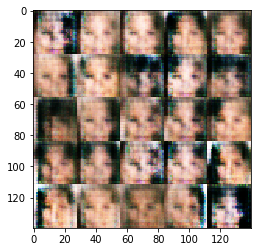

Epoch 1/1... Discriminator Loss: 1.1135... Generator Loss: 1.2195


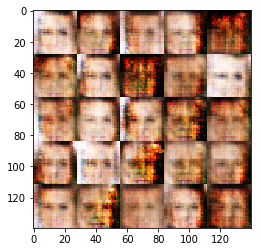

Epoch 1/1... Discriminator Loss: 1.0742... Generator Loss: 2.2960


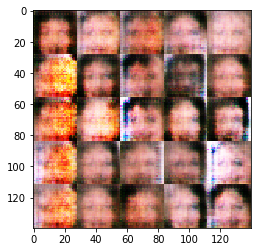

Epoch 1/1... Discriminator Loss: 1.0519... Generator Loss: 1.3108


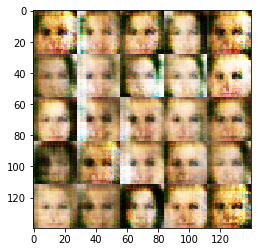

Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 1.4522


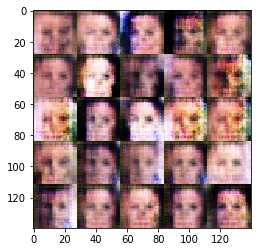

Epoch 1/1... Discriminator Loss: 1.0102... Generator Loss: 1.1251


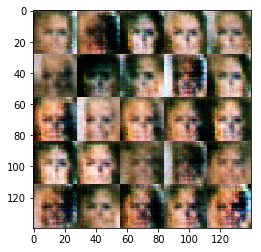

Epoch 1/1... Discriminator Loss: 1.1107... Generator Loss: 0.9766


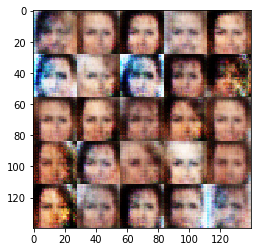

Epoch 1/1... Discriminator Loss: 1.3387... Generator Loss: 1.7855


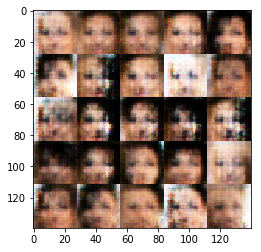

Epoch 1/1... Discriminator Loss: 1.0881... Generator Loss: 1.1962


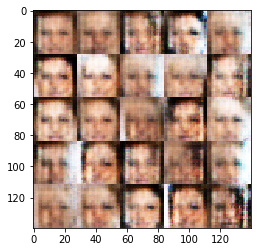

Epoch 1/1... Discriminator Loss: 1.1431... Generator Loss: 0.9521


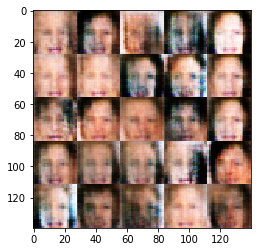

Epoch 1/1... Discriminator Loss: 1.1728... Generator Loss: 1.2753


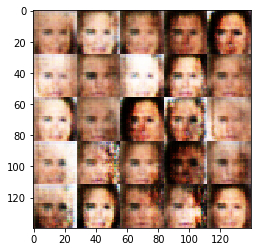

Epoch 1/1... Discriminator Loss: 1.1144... Generator Loss: 0.8020


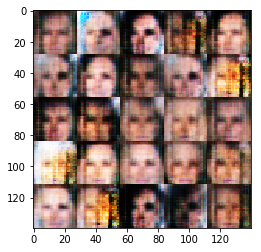

Epoch 1/1... Discriminator Loss: 1.0712... Generator Loss: 1.2536


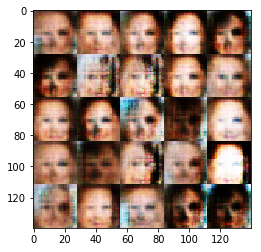

Epoch 1/1... Discriminator Loss: 1.2398... Generator Loss: 2.2856


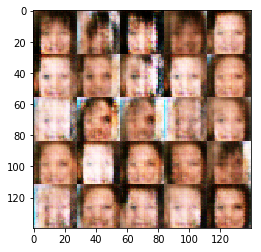

Epoch 1/1... Discriminator Loss: 1.0242... Generator Loss: 1.1750


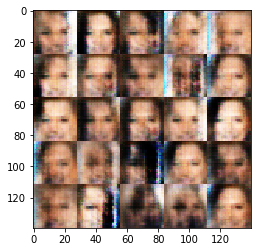

Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 2.1658


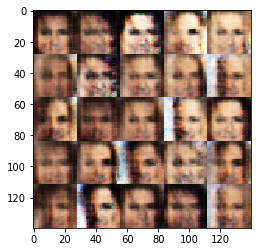

Epoch 1/1... Discriminator Loss: 1.2269... Generator Loss: 0.8925


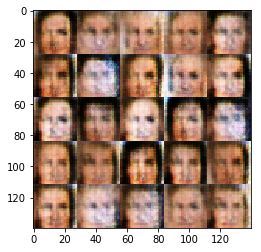

Epoch 1/1... Discriminator Loss: 0.9850... Generator Loss: 1.2101


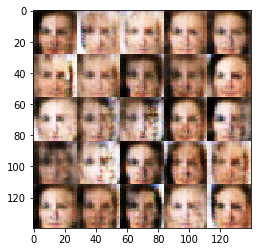

Epoch 1/1... Discriminator Loss: 1.0717... Generator Loss: 1.2949


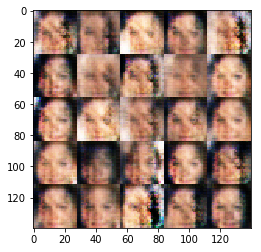

Epoch 1/1... Discriminator Loss: 1.4490... Generator Loss: 0.6058


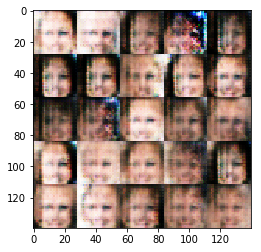

Epoch 1/1... Discriminator Loss: 0.9928... Generator Loss: 1.0826


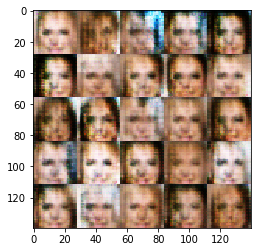

Epoch 1/1... Discriminator Loss: 1.4294... Generator Loss: 0.6728


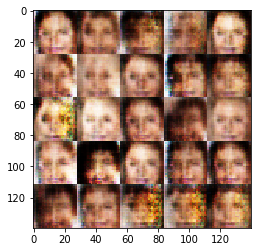

Epoch 1/1... Discriminator Loss: 0.7871... Generator Loss: 1.5419


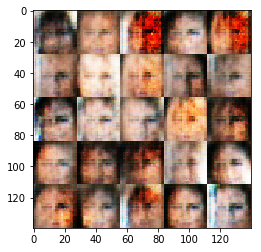

Epoch 1/1... Discriminator Loss: 1.3551... Generator Loss: 0.8132


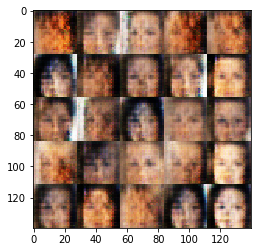

Epoch 1/1... Discriminator Loss: 0.9886... Generator Loss: 1.4400


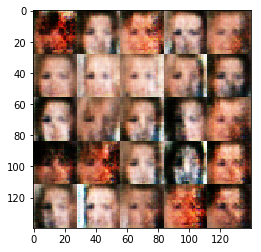

Epoch 1/1... Discriminator Loss: 1.0510... Generator Loss: 1.0912


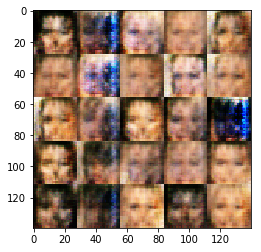

Epoch 1/1... Discriminator Loss: 0.9146... Generator Loss: 1.4076


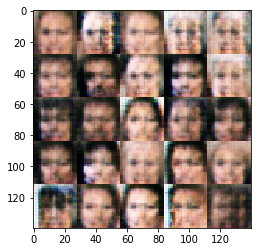

Epoch 1/1... Discriminator Loss: 1.1327... Generator Loss: 1.0433


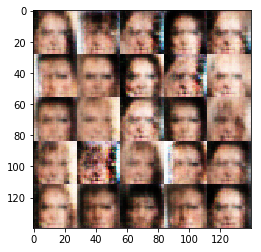

Epoch 1/1... Discriminator Loss: 0.9378... Generator Loss: 1.9196


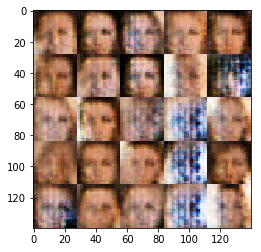

Epoch 1/1... Discriminator Loss: 1.1362... Generator Loss: 0.9365


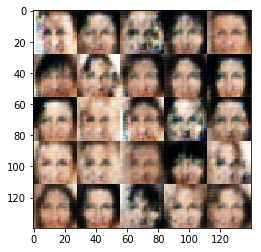

Epoch 1/1... Discriminator Loss: 1.1189... Generator Loss: 1.3928


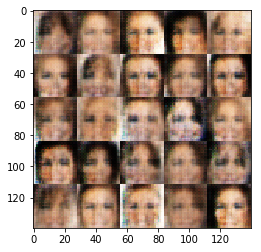

Epoch 1/1... Discriminator Loss: 0.9258... Generator Loss: 1.9174


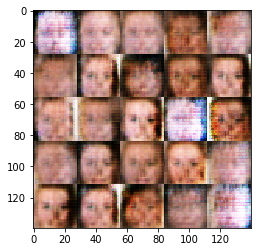

In [ ]:
batch_size = 128
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.